In [1]:
import pickle

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

from society.visualisation.network import *

plt.rcParams["figure.figsize"] = (24, 10)
plt.rcParams["figure.dpi"] = 300
plt.rcParams["font.size"] = 18

In [2]:
def graph(data):
    df = pd.DataFrame(
        [
            ["train", population, lb, i + 1, r]
            for (population, lb, t), episodes in data["train_society_rewards"].items()
            for society_rewards in episodes
            for i, r in enumerate(society_rewards)
        ]
        + [
            ["test", population, lb, i + 1, r]
            for (population, lb, t), episodes in data["test_society_rewards"].items()
            for society_rewards in episodes
            for i, r in enumerate(society_rewards)
        ],
        columns=["phase", "population", "lookback", "timestep", "society_reward"],
    )

    sns.set_style("darkgrid")
    g = sns.relplot(
        data=df[df["population"] >= 256],
        x="timestep",
        y="society_reward",
        hue="lookback",
        col="population",
        kind="line",
        aspect=2,
        palette="mako",
        errorbar="sd",
        facet_kws={"sharey": False, "sharex": False},
        row="phase",
    )

    return df, g

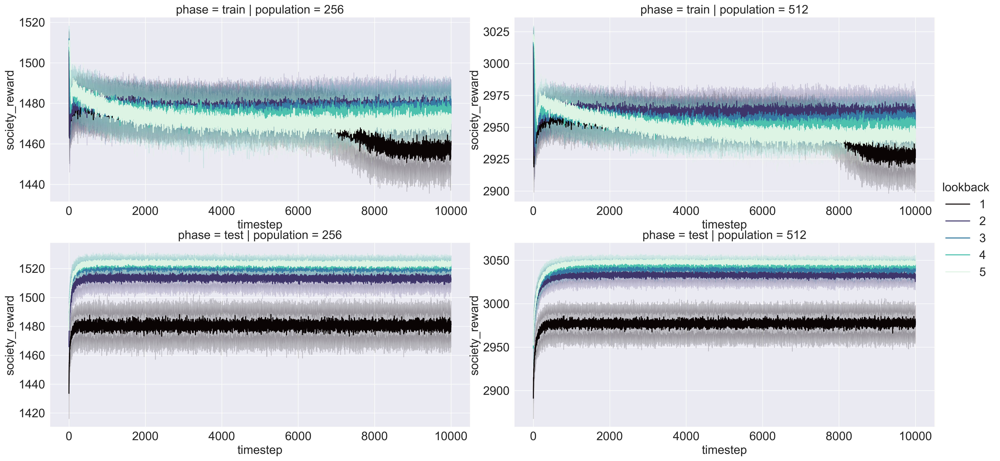

In [7]:
with open("analysis/society-rewards-ipd.pickle", "rb") as f:
    data = pickle.load(f)

graph(data)

(          phase  population  lookback  timestep  society_reward
 0         train          16         1         1              93
 1         train          16         1         2              91
 2         train          16         1         3              91
 3         train          16         1         4              93
 4         train          16         1         5              89
 ...         ...         ...       ...       ...             ...
 11999995   test         512         5      9996            3045
 11999996   test         512         5      9997            3053
 11999997   test         512         5      9998            3048
 11999998   test         512         5      9999            3030
 11999999   test         512         5     10000            3054
 
 [12000000 rows x 5 columns],
 <seaborn.axisgrid.FacetGrid at 0x15e0dfcb970>)

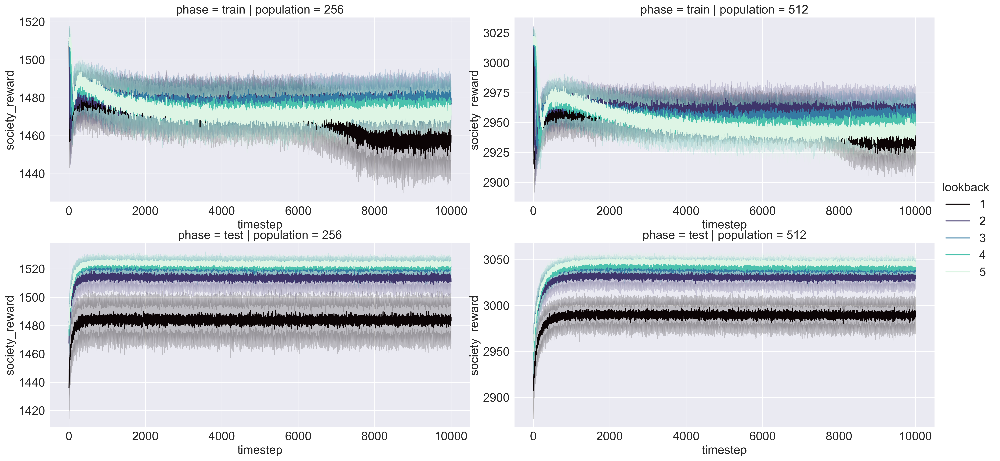

In [11]:
with open("analysis/society-rewards-ipd-threshold-0.2.pickle", "rb") as f:
    data = pickle.load(f)

graph(data)

(          phase  population  lookback  timestep  society_reward
 0         train          16         1         1              93
 1         train          16         1         2              94
 2         train          16         1         3              92
 3         train          16         1         4              86
 4         train          16         1         5              90
 ...         ...         ...       ...       ...             ...
 11999995   test         512         5      9996            2994
 11999996   test         512         5      9997            3010
 11999997   test         512         5      9998            2981
 11999998   test         512         5      9999            2983
 11999999   test         512         5     10000            2979
 
 [12000000 rows x 5 columns],
 <seaborn.axisgrid.FacetGrid at 0x15e7dca6ec0>)

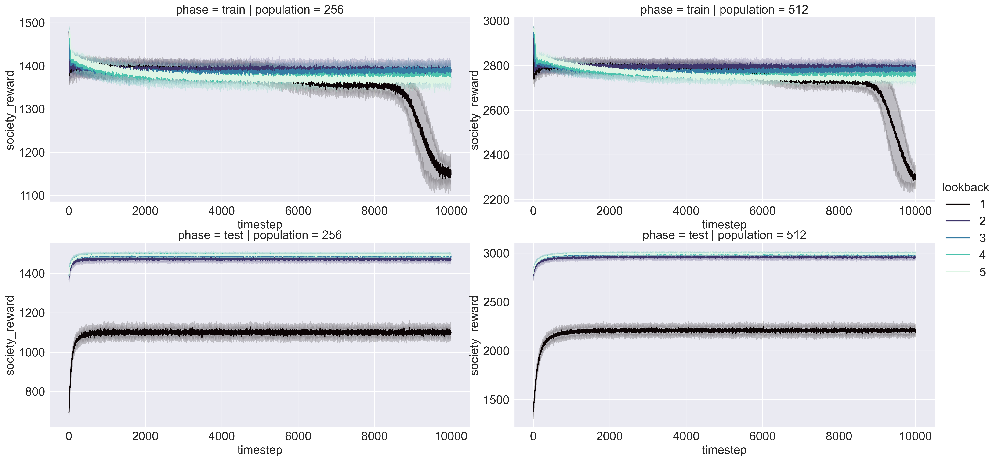

In [12]:
with open("analysis/society-rewards-ipd-epsilon-0.2.pickle", "rb") as f:
    data = pickle.load(f)

graph(data)

(         phase  population  lookback  timestep  society_reward
 0        train        1024         1         1            6050
 1        train        1024         1         2            6026
 2        train        1024         1         3            6047
 3        train        1024         1         4            6018
 4        train        1024         1         5            6008
 ...        ...         ...       ...       ...             ...
 3899995   test        2048         3      9996           12152
 3899996   test        2048         3      9997           12164
 3899997   test        2048         3      9998           12144
 3899998   test        2048         3      9999           12172
 3899999   test        2048         3     10000           12177
 
 [3900000 rows x 5 columns],
 <seaborn.axisgrid.FacetGrid at 0x22ca7970370>)

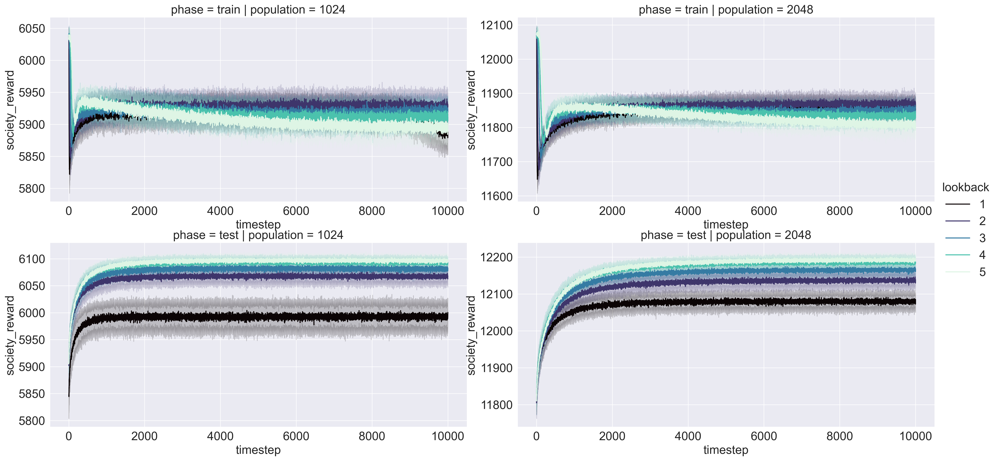

In [3]:
with open("analysis/society-rewards-ipd-large.pickle", "rb") as f:
    data = pickle.load(f)

graph(data)